# Project 1: Analysis and Forecasting of NYC Taxi Rides
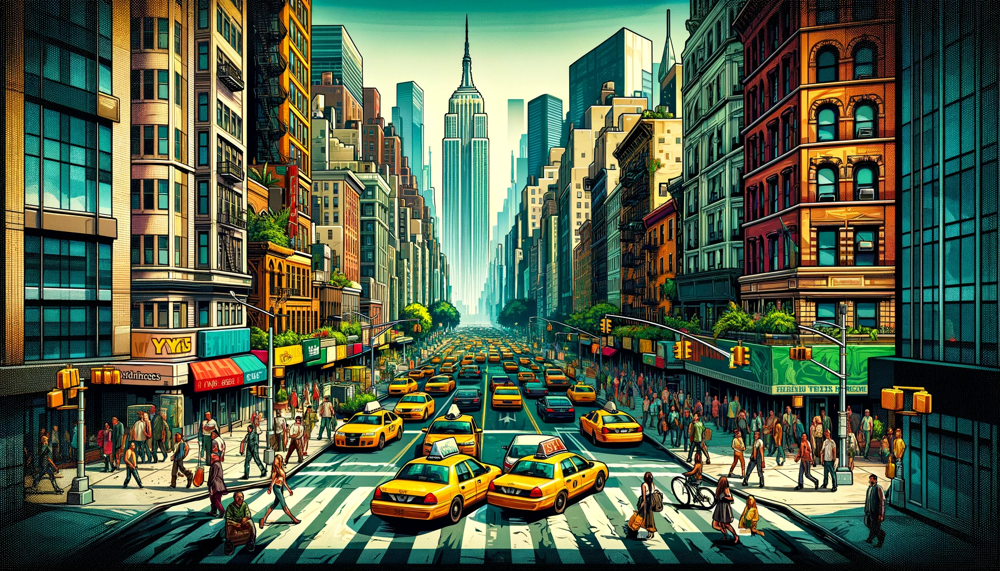

In [1]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the Data

Yellow and green taxi trip records include fields capturing 
- pick-up and drop-off dates/times
- pick-up and drop-off locations
- trip distances
- itemized fares
- rate types
- payment types
- driver-reported passenger counts 
  
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) by technology providers authorized under the Taxicab & Livery Passenger Enhancement Programs (TPEP/LPEP). The trip data was not created by the TLC, and TLC makes no representations as to the accuracy of these data.

**Remark**: Feel free to change the *months* and *year* in the code below, if you need more/less data. 

In [2]:
import pandas as pd
from src.utils import load_data_from_google_drive

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in

months = ['01', '02', '03', '04', '05', '06']
# months = ['01', '02']
year = '2022'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [3]:
df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0


In [4]:
# Saving original df's incase they are needed later
df_yellow_original = df_yellow
df_green_original = df_green


In [5]:
df_green.head(5)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.50,0.5,0.00,0.0,None,0.3,4.80,2.0,1.0,0.00
1,1,2022-01-01 00:20:55,2022-01-01 00:29:38,N,1.0,116,41,1.0,2.10,9.5,0.50,0.5,0.00,0.0,None,0.3,10.80,2.0,1.0,0.00
2,1,2022-01-01 00:57:02,2022-01-01 01:13:14,N,1.0,41,140,1.0,3.70,14.5,3.25,0.5,4.60,0.0,None,0.3,23.15,1.0,1.0,2.75
3,2,2022-01-01 00:07:42,2022-01-01 00:15:57,N,1.0,181,181,1.0,1.69,8.0,0.50,0.5,0.00,0.0,None,0.3,9.30,2.0,1.0,0.00
4,2,2022-01-01 00:07:50,2022-01-01 00:28:52,N,1.0,33,170,1.0,6.26,22.0,0.50,0.5,5.21,0.0,None,0.3,31.26,1.0,1.0,2.75


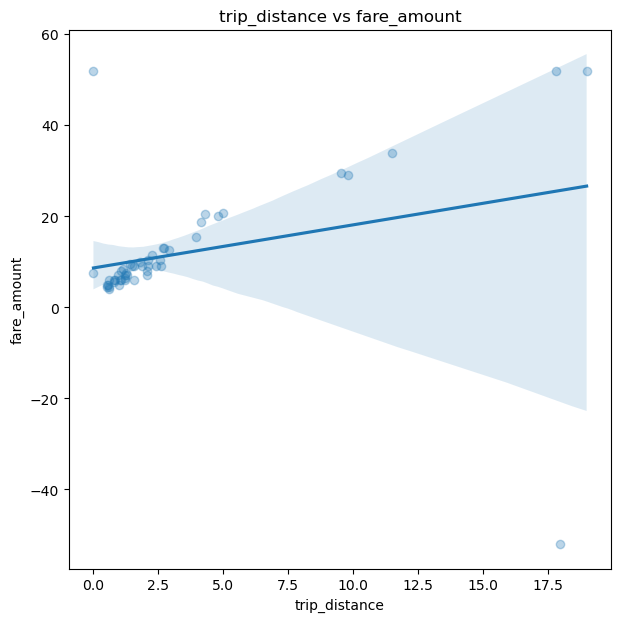

In [6]:
from src.utils import create_scatterplot

create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',
)

### Task 2: Exploratory Data Analysis
Conduct exploratory data analysis to understand the patterns and relationships in the data. This includes analyzing the distribution of trip distances, fares, and passenger counts, as well as the relationship between these variables.

### Nodes To Nodebook!

The comments and task 5 are made from interpreting graphs based on data for months 1-6.

Task 5 only works if data from month 1-6 is used but the rest of the figures works with any number of moths in the range of month 1-6.

(aka you can use month 1-2 if its to heavy on your computer for task 1-4 but the comments might not refer directly to the data you are looking at)

### Task 2

First we want to do some sorting of the data to be sure we only take relevant data into account:

In [3]:
import datetime as dt
from datetime import datetime

# Convert the column to datetime64[ns]
df_yellow['datetime'] = pd.to_datetime(df_yellow['tpep_pickup_datetime'])
df_green['datetime'] = pd.to_datetime(df_green['lpep_pickup_datetime'])


In [4]:
# Sorting the data so only relevant dates are kept.
# Even though we only load for month 1-6 in 2022, we get some irrelevant dates wich we do not want to include.
df_yellow=df_yellow[(df_yellow['datetime'].dt.year == 2022) & (df_yellow['datetime'].dt.month <7)]
df_green=df_green[(df_green['datetime'].dt.year == 2022) & (df_green['datetime'].dt.month <7)]


# we also want to ignore fare amount wich are unrealistically high:

df_yellow = df_yellow[df_yellow['fare_amount']<10000]

In [9]:

# Calculate IQR for trip distance and fare amount for yellow taxi
q1_yellow = df_yellow['trip_distance'].quantile(0.25)
q3_yellow = df_yellow['trip_distance'].quantile(0.75)
iqr_yellow = q3_yellow - q1_yellow
tukey_fence_yellow = 1.5 * iqr_yellow

# Filter out outliers for yellow taxi
df_yellow_filtered = df_yellow[(df_yellow['trip_distance'] >= q1_yellow - tukey_fence_yellow) &
                               (df_yellow['trip_distance'] <= q3_yellow + tukey_fence_yellow)]

# Repeat the process for fare amount
q1_fare_yellow = df_yellow['fare_amount'].quantile(0.25)
q3_fare_yellow = df_yellow['fare_amount'].quantile(0.75)
iqr_fare_yellow = q3_fare_yellow - q1_fare_yellow
tukey_fence_fare_yellow = 1.5 * iqr_fare_yellow

# Filter out outliers for yellow taxi (fare amount)
df_yellow_filtered = df_yellow_filtered[(df_yellow_filtered['fare_amount'] >= q1_fare_yellow - tukey_fence_fare_yellow) &
                                         (df_yellow_filtered['fare_amount'] <= q3_fare_yellow + tukey_fence_fare_yellow)]

# Similar process for green taxi
q1_green = df_green['trip_distance'].quantile(0.25)
q3_green = df_green['trip_distance'].quantile(0.75)
iqr_green = q3_green - q1_green
tukey_fence_green = 1.5 * iqr_green

df_green_filtered = df_green[(df_green['trip_distance'] >= q1_green - tukey_fence_green) &
                             (df_green['trip_distance'] <= q3_green + tukey_fence_green)]

q1_fare_green = df_green['fare_amount'].quantile(0.25)
q3_fare_green = df_green['fare_amount'].quantile(0.75)
iqr_fare_green = q3_fare_green - q1_fare_green
tukey_fence_fare_green = 1.5 * iqr_fare_green

df_green_filtered = df_green_filtered[(df_green_filtered['fare_amount'] >= q1_fare_green - tukey_fence_fare_green) &
                                       (df_green_filtered['fare_amount'] <= q3_fare_green + tukey_fence_fare_green)]



In [10]:

len(df_green)-len(df_green_filtered)

13386

In [11]:

len(df_yellow)-len(df_yellow_filtered)

672421

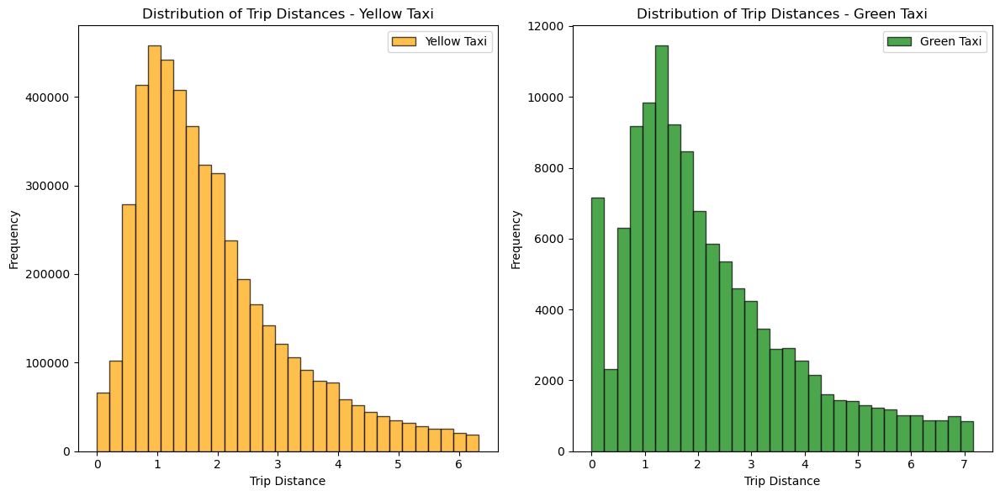

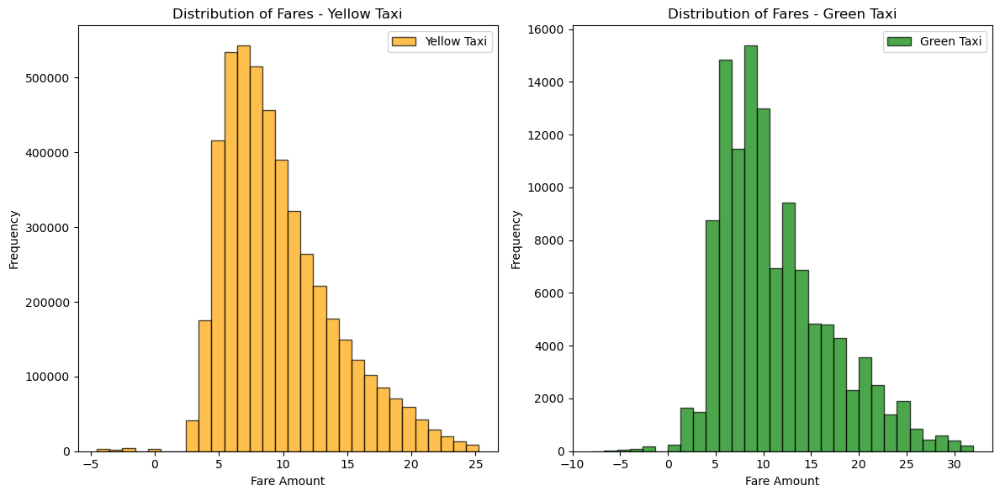

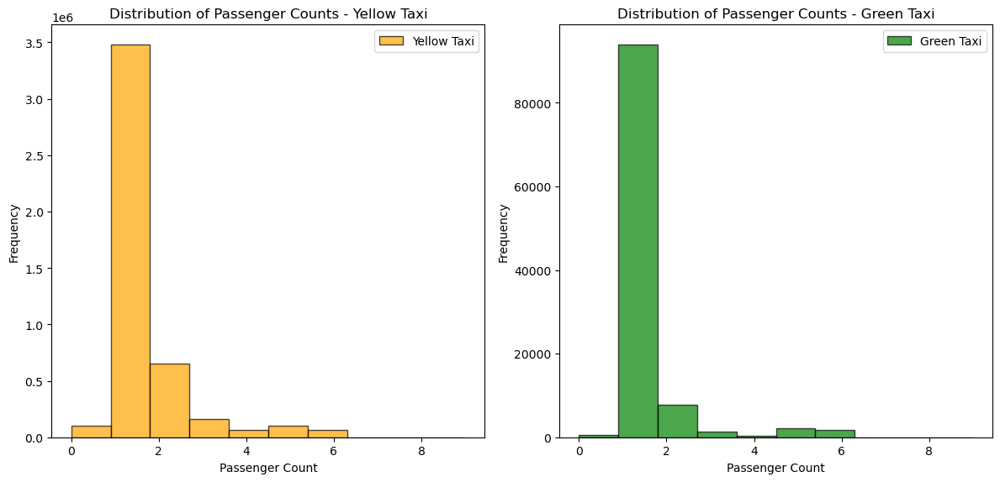

NameError: name 'sns' is not defined

<Figure size 700x700 with 0 Axes>

In [12]:


import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_yellow_filtered['trip_distance'], bins=30, color='orange', edgecolor='black', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Trip Distances - Yellow Taxi')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()



plt.subplot(1, 2, 2)
plt.hist(df_green_filtered['trip_distance'], bins=30, color='green', edgecolor='black', alpha=0.7, label='Green Taxi')
plt.title('Distribution of Trip Distances - Green Taxi')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.savefig('taxi_Distribiution of Trip Distances')
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_yellow_filtered['fare_amount'], bins=30, color='orange', edgecolor='black', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Fares - Yellow Taxi')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(df_green_filtered['fare_amount'], bins=30, color='green', edgecolor='black', alpha=0.7, label='Green Taxi')
plt.title('Distribution of Fares - Green Taxi')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.savefig('Taxi_Distribution of Fares')
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_yellow_filtered['passenger_count'], bins=10, color='orange', edgecolor='black', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Passenger Counts - Yellow Taxi')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(df_green_filtered['passenger_count'], bins=10, color='green', edgecolor='black', alpha=0.7, label='Green Taxi')
plt.title('Distribution of Passenger Counts - Green Taxi')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.savefig('Taxi_distribution of Passenger Counts.png')
plt.show()

plt.figure(figsize=(7,7))
df_scatter = df_yellow_filtered.sample(1000)
sns.regplot(x=df_scatter['trip_distance'],y=df_scatter['fare_amount'],scatter_kws={'alpha':0.3})
plt.title('Trip Distance vs Fare Amount - Yellow Taxi' )
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.savefig('Trip_Distance_vs_Fare_Amount_Yellow_Taxi.png')
plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

# Add a 'Taxi Type' column to each dataframe
df_yellow_filtered['Taxi Type'] = 'Yellow'
df_green_filtered['Taxi Type'] = 'Green'

# Combine both datasets for the boxplot
combined_df = pd.concat([df_yellow_filtered[['fare_amount', 'Taxi Type']], df_green_filtered[['fare_amount', 'Taxi Type']]])

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Individual boxplot for Green Taxis (switched position)
sns.boxplot(y='fare_amount', x='Taxi Type', data=combined_df[combined_df['Taxi Type'] == 'Green'],
            palette={'Green': 'green'}, ax=axes[0])
axes[0].set_title('Fare Amounts - Green Taxis')
axes[0].set_xlabel('Taxi Type')
axes[0].set_ylabel('Fare Amount')

# Individual boxplot for Yellow Taxis (switched position)
sns.boxplot(y='fare_amount', x='Taxi Type', data=combined_df[combined_df['Taxi Type'] == 'Yellow'],
            palette={'Yellow': 'orange'}, ax=axes[1])
axes[1].set_title('Fare Amounts - Yellow Taxis')
axes[1].set_xlabel('Taxi Type')
axes[1].set_ylabel('Fare Amount')

# Adjust layout
plt.tight_layout()
plt.savefig('Fare Amount')
plt.show()



In [ ]:


plt.figure(figsize=(7,7))
df_scatter = df_green_filtered.sample(1000)
sns.regplot(x=df_scatter['trip_distance'],y=df_scatter['fare_amount'],scatter_kws={'alpha':0.3}, color='green')
plt.title('Trip Distance vs Fare Amount - Green Taxi' )
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.savefig('Trip_Distance_vs_Fare_Amount_green_Taxi.png')
plt.show()




the outliers 0 does not make sence to include in our scatterplots because of no
possible earnings in a trip with no distance.We applied the Tu-key fence method to filter out outliers.

In [ ]:


plt.figure(figsize=(7,7))
df_scatter = df_green_filtered.sample(1000)
sns.regplot(x=df_scatter['trip_distance'],y=df_scatter['fare_amount'],scatter_kws={'alpha':0.3}, color='orange')
plt.title('Trip Distance vs Fare Amount - Green Taxi' )
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.savefig('Trip_Distance_vs_Fare_Amount_yellow_Taxi.png')
plt.show()



In [ ]:


import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Histogram for Yellow Taxi
plt.subplot(1, 2, 1)
plt.hist(df_yellow_filtered['trip_distance'], bins=30, color='orange', edgecolor='black', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Trip Distances - Yellow Taxi')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()

# Histogram for Green Taxi
plt.subplot(1, 2, 2)
plt.hist(df_green_filtered['trip_distance'], bins=30, color='green', edgecolor='black', alpha=0.7, label='Green Taxi')
plt.title('Distribution of Trip Distances - Green Taxi')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()



**Textbook Practice**:
Apply the principle of "choosing an effective visual" in Chapter 2 to make the visualization. Explain how this principle is applied.

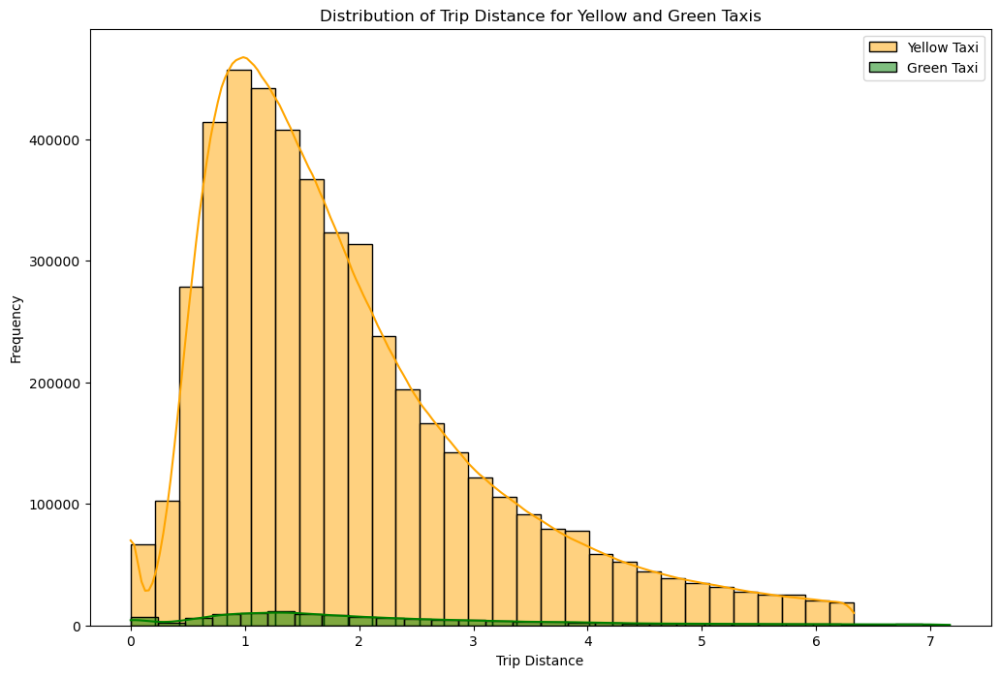

In [13]:


# Write your code and/or markdowns
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))

# Plot histogram for trip distance for Yellow Taxi
sns.histplot(x='trip_distance', data=df_yellow_filtered, color='orange', label='Yellow Taxi', bins=30, kde=True)

# Plot histogram for trip distance for Green Taxi
sns.histplot(x='trip_distance', data=df_green_filtered, color='green', label='Green Taxi', bins=30, kde=True)

plt.title('Distribution of Trip Distance for Yellow and Green Taxis')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()

plt.savefig('Distribution of Trip Distance for Yellow and Green Taxis')
plt.show()



Throughout task 2, we have choosen to use barplots since they are commen and therefore easy to understand since they are familiar. Besides that, it is also a visual that makes it easy to se the distribution in the frequency.

### Task 3: Spatial Analysis
Use Kepler.gl (https://kepler.gl/) or similar tools/packages to visualize the spatial patterns of taxi rides. This includes the pickup and dropoff locations, as well as the routes taken. Analyze the spatial patterns to identify hotspots of taxi demand.

You can find a good tutorial on https://docs.kepler.gl/docs/keplergl-jupyter#install for how to use it in jupyter notebook with python.

**Hint** In order to visualize the pickup/dropoff location geographically, you might need to know the latitude (lat) and longitude (lng) for each location. You can find the corresponding information in the dataframe "df_zones".

**Preparing the data:**

Including grouping pr. pickup location and joining data with df_zone which have locations.

In [14]:
len(df_zones)


263

In [15]:
df_zones.head()

,Shape_Leng,Shape_Area,zone,LocationID,borough,lat,lng
0,0.116357,0.000782,Newark Airport,1,EWR,40.689516,-74.176786
1,0.433470,0.004866,Jamaica Bay,2,Queens,40.625724,-73.826126
2,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,40.865888,-73.849479
3,0.043567,0.000112,Alphabet City,4,Manhattan,40.724152,-73.977023
4,0.092146,0.000498,Arden Heights,5,Staten Island,40.550340,-74.189930


In [16]:

# Making df with only lokation and zone id:
df_test = df_zones[['lat', 'lng', 'LocationID']]
df_test

,lat,lng,LocationID
0,40.689516,-74.176786,1
1,40.625724,-73.826126,2
2,40.865888,-73.849479,3
3,40.724152,-73.977023,4
4,40.550340,-74.189930,5
...,...,...,...
258,40.899103,-73.856351,259
259,40.746798,-73.903713,260
260,40.708976,-74.012919,261
261,40.776534,-73.945830,262


In [17]:
# Finding the 1 most used pickup locations:

# For yellow
test = df_yellow.groupby(['PULocationID', 'DOLocationID'])['trip_distance'].count().reset_index(name='count')
y_most_used = test.sort_values(by='count').tail(1)
y_most_used

# For green
test2 = df_green.groupby(['PULocationID', 'DOLocationID'])['trip_distance'].count().reset_index(name='count')
g_most_used = test2.sort_values(by='count').tail(1)
g_most_used

,PULocationID,DOLocationID,count
3085,74,75,2705


In [18]:
# Groupings for maps:

# Finding average trip distance for yellow taxis:
Yellow_TripDist_From = df_yellow.groupby('PULocationID')['trip_distance'].mean().reset_index(name='Mean_TripDist_From')

# Pickup and dropoff location - count:
Yellow_PUL = df_yellow.groupby('PULocationID')['VendorID'].count().reset_index(name='count')
Yellow_DOL = df_yellow.groupby('DOLocationID')['VendorID'].count().reset_index(name='count')
Green_PUL = df_green.groupby('PULocationID')['VendorID'].count().reset_index(name='count')
Green_DOL = df_green.groupby('DOLocationID')['VendorID'].count().reset_index(name='count')

Yellow_TripDist_From

,PULocationID,Mean_TripDist_From
0,1,0.987963
1,2,18.024000
2,3,6.498082
3,4,2.838995
4,5,21.446761
...,...,...
255,261,8.248501
256,262,5.575079
257,263,5.869581
258,264,4.838314


In [19]:
# Join to map data (Yellow) From point

Yellow_PUL.rename(columns={'PULocationID': 'LocationID'}, inplace=True)
merged_df = pd.merge(Yellow_PUL, df_test, on='LocationID', how='inner')

Yellow_TripDist_From.rename(columns={'PULocationID': 'LocationID'}, inplace=True)
Y_TripDist_ToMap = pd.merge(Yellow_TripDist_From, df_test, on='LocationID', how='inner')


# join to map data green: (To/from)

Green_PUL.rename(columns={'PULocationID': 'LocationID'}, inplace=True)
G_PU_ToMap= pd.merge(Green_PUL, df_test, on='LocationID', how='inner')


Green_DOL.rename(columns={'DOLocationID': 'LocationID'}, inplace=True)
G_DO_ToMap = pd.merge(Green_DOL, df_test, on='LocationID', how='inner')

**Maps**

Now that we have prepared the data, we can plot it to Kepler.

The way we made the maps was to load the data, modify the layout and then saving it as an png.
The map that is showed below is keplers standart and below the modified map is loadet as png:

In [20]:

from keplergl import KeplerGl

map1 = KeplerGl()
map1.add_data(data=merged_df, name='data1')
map1.add_data(data=G_PU_ToMap, name='data2')
map1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data1': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 2…

Above we see number of picups pr. lokation. It is possible to se that (in this case) yellow taxis have most pickups on Manhatten but it is a bit messy with all the dots in colors.

To forcus our audience attention, we modified the map as showed below.
The backgroud map got a more neutral color and only the most used location is in color while the rest of the locations is in grey, same as the background. This will immediately take the attention to what we want to show. In this case that yellow taxis have most pickups at Manhatten and green taxis have most pickups around and northen Manhatten.

We also choose to give them colors which match the name of the data, to make it easy to distinquish the two.

(modified map below)

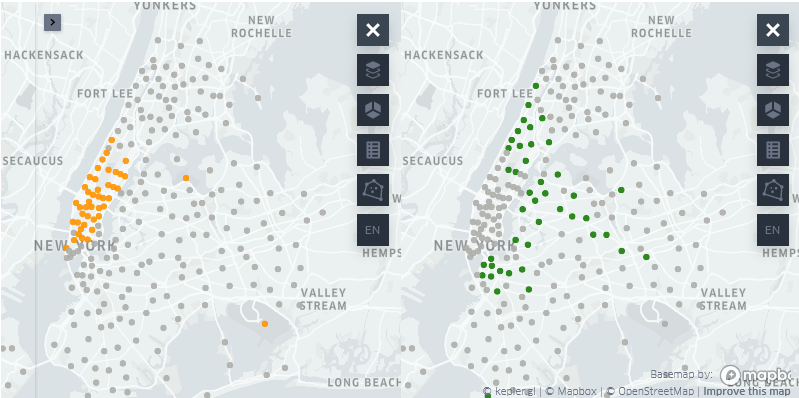

In [21]:
# show png:
from PIL import Image
from IPython.display import display
import os

# Get the current working directory
current_directory = os.getcwd()

# Picture name:
Task3_Taxa_PickupLocation = 'Task3_Taxa_PickupLocation.png'

# construct path:
image_path = os.path.join(current_directory, Task3_Taxa_PickupLocation)
img_PIL = Image.open(image_path)

#Display
display(img_PIL)



The following map was mostly to explore if we could se a pattern in travel distance, but sincewe couldn't see a clear pattern, we decided not to make a final plot of this map.

In [22]:
# plotting Tripdistance:
map2 = KeplerGl()
map2.add_data(data=Y_TripDist_ToMap, name='data1')
map2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data1': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 2…

**The 1 most used pickup location for green and yellow:**

Same as before: we first load the data, and afterwards load the final PNG:

In [23]:
y_most_used.rename(columns={'PULocationID': 'LocationID'}, inplace=True)
y_most_used_ToMap = pd.merge(y_most_used, df_test, on='LocationID', how='inner')

g_most_used.rename(columns={'PULocationID': 'LocationID'}, inplace=True)
g_most_used_ToMap = pd.merge(g_most_used, df_test, on='LocationID', how='inner')


map4 = KeplerGl()
map4.add_data(data=y_most_used_ToMap, name='Most used Pickup locatin for yellow')
map4.add_data(data=g_most_used_ToMap, name='Most used Pickup locatin for green')
map4


User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Most used Pickup locatin for yellow': {'index': [0], 'columns': ['LocationID', 'DOLocationID',…

Above we have Keplers standart layout.
On the pucture below, we have (again) choosen a light grey background to make it less in focus to draw attention to the only two colored points on the map.
The attention should go to the orange dot first, which indicates most used pickup location for the yellow taxis and there after to the gren dot wich is most used picup location for green taxis. The green dot is smaller since less pickups happens at the green location.
We have choosen to only show the two dts to make it clear were the attention should go and eliminate clutter.

(see below)

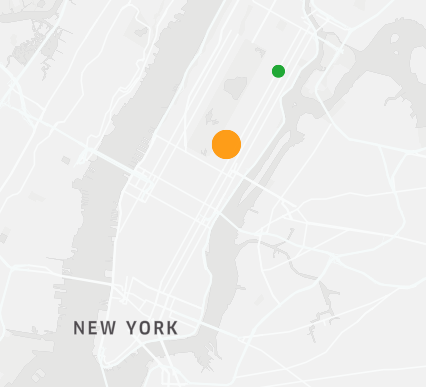

In [24]:
# Get the current working directory
current_directory = os.getcwd()

# Picture name:
Task3_Taxa_PickupLocation_MostUsed = 'Task3_Taxa_PickupLocation_MostUsed.png'

# construct path:
image_path = os.path.join(current_directory, Task3_Taxa_PickupLocation_MostUsed)
img_PIL = Image.open(image_path)

#Display
display(img_PIL)

**Textbook Practice**: Apply the principle "focus your audience's attention" in Chapter 4. Explain briefly how you expect your visualization captures your audience's attention.

See the text at the maps.

### Task 4: Temporal Analysis
Analyze the temporal patterns of taxi rides. This includes the number of rides by time of day, day of the week, and month of the year. Also, analyze the relationship between temporal patterns and other variables, such as trip distance and fare.

You can find very good code examples to use on this page https://www.machinelearningplus.com/time-series/time-series-analysis-python/?utm_content=cmp-true

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
from datetime import datetime


First we prepare the data. This includes making new columns with date, year, month, hour and weekday.
We also do some grouping were we count numbers of datapoints in the categories mentioned above.

In [37]:
# Structure of data:
#df_yellow = df_yellow_original
#df_green = df_green_original

# Weekday for pickup:
# 0 is monday, 5,6 is weekend
df_yellow['weekday'] = df_yellow['tpep_pickup_datetime'].dt.weekday
df_green['weekday'] = df_green['lpep_pickup_datetime'].dt.weekday

# Convert the column to datetime64[ns]
# df_yellow['datetime'] = pd.to_datetime(df_yellow['tpep_pickup_datetime'])
# df_green['datetime'] = pd.to_datetime(df_green['lpep_pickup_datetime'])

# Cleaning dates outside timeperiode out:
# df_yellow=df_yellow[(df_yellow['datetime'].dt.year == 2022) & (df_yellow['datetime'].dt.month <7)]
# df_green=df_green[(df_green['datetime'].dt.year == 2022) & (df_green['datetime'].dt.month <7)]

# Extract the hour for the entire column
df_yellow['hour'] = df_yellow['datetime'].dt.hour
df_green['hour'] = df_green['datetime'].dt.hour
df_yellow_filtered['hour'] = df_yellow_filtered['datetime'].dt.hour
df_green_filtered['hour'] = df_green_filtered['datetime'].dt.hour


# Extract the month for the entire column
df_yellow['month'] = df_yellow['datetime'].dt.month
df_green['month'] = df_green['datetime'].dt.month

# DAte column to use for counting unique dates for calculating numbers pr. day
df_yellow['date'] = df_yellow['datetime'].dt.date
df_green['date'] = df_green['datetime'].dt.date




# Grouping weekday and date and counting values
yellow_weekday_datecount = df_yellow.groupby(['weekday', 'date'])['VendorID'].count().reset_index(name='count')
green_weekday_datecount = df_green.groupby(['weekday', 'date'])['VendorID'].count().reset_index(name='count')

# Now we only group pr. weekday.
# We count the count from above to get Number of days in data pr. weekday.
# And sum the count to get the count to get the number of datapoints pr. weekday.
yellow_weekday = yellow_weekday_datecount.groupby('weekday')['count'].agg(count = 'count', sum = 'sum').reset_index()
green_weekday = green_weekday_datecount.groupby('weekday')['count'].agg(count = 'count', sum = 'sum').reset_index()

#df_yellow['datetime'].dt.unique()

#Calculating count pr. day:
yellow_weekday['count pr. day'] = yellow_weekday['sum']/yellow_weekday['count']
green_weekday['count pr. day'] = green_weekday['sum']/green_weekday['count']
green_weekday.head()

MemoryError: Unable to allocate 151. MiB for an array with shape (19817033,) and data type int64

In [33]:
# We assume same number of days for yellow and green taxas since it's the same time period.
# calculate number of dates:
NumberOfDates = len(df_yellow['datetime'].dt.date.unique())
yellow_weekday_datecount.head()


,weekday,date,count
0,0,2022-01-03,72405
1,0,2022-01-10,73692
2,0,2022-01-17,63518
3,0,2022-01-24,78541
4,0,2022-01-31,85899


In [34]:

yellow_weekday.head()

,weekday,count,sum,count pr. day
0,0,26,2547613,97985.115385
1,1,26,2878244,110701.692308
2,2,26,2986832,114878.153846
3,3,26,3090890,118880.384615
4,4,25,2976927,119077.080000


C:\Users\phill\AppData\Local\Temp\ipykernel_2244\3867350530.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\phill\AppData\Local\Temp\ipykernel_2244\3867350530.py:35: UserWarning:

FixedFormatter should only be used together with FixedLocator



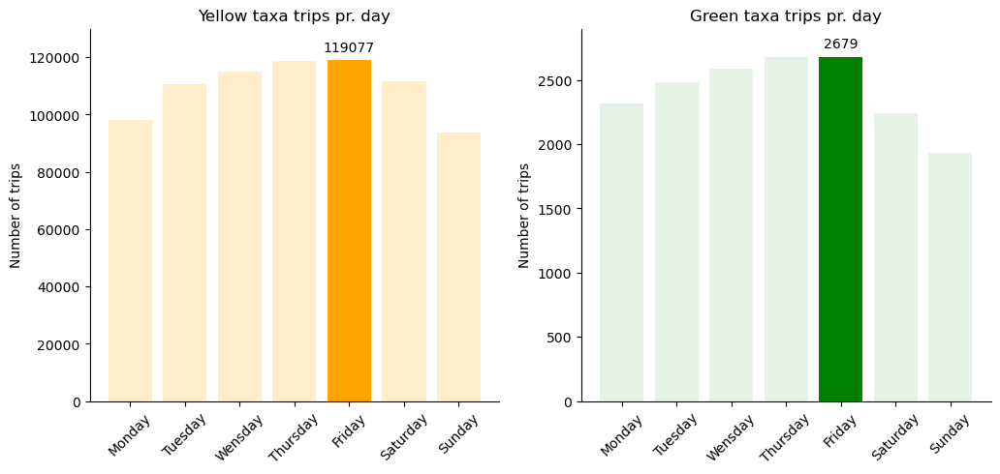

In [35]:
# Plots for weekdays

# Find the column with the highest count
max_count_yellow = yellow_weekday['count pr. day'].idxmax()
max_count_green = green_weekday['count pr. day'].idxmax()

weekday_labels = ['','Monday', 'Tuesday', 'Wensday', 'Thursday', 'Friday', 'Saturday', 'Sunday']


fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot of yellow, count pr. weekday:
axes[0].bar(yellow_weekday['weekday'], yellow_weekday['count pr. day'], color='orange', alpha=0.2, label='Day of week')
axes[0].bar(yellow_weekday['weekday'][max_count_yellow], yellow_weekday['count pr. day'][max_count_yellow], color='orange', alpha=1.0, label='Highest Count')
#axes[0].set_xlabel('Day of week')
axes[0].set_ylabel('Number of trips')
axes[0].set_title('Yellow taxa trips pr. day')
axes[0].set_ylim(0, 130000)
# axes[0].legend()
axes[0].text(yellow_weekday['weekday'][max_count_yellow], yellow_weekday['count pr. day'][max_count_yellow]+2000,  f'{round(yellow_weekday["count pr. day"][max_count_yellow])}', ha='center', va='bottom')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].set_xticklabels(weekday_labels, rotation = 45)

# Plot of green, count pr. weekday:
axes[1].bar(green_weekday['weekday'], green_weekday['count pr. day'], color='green', alpha=0.1, label='Day of week')
axes[1].bar(green_weekday['weekday'][max_count_green], green_weekday['count pr. day'][max_count_green], color='green', alpha=1.0, label='Highest Count')
#axes[1].set_xlabel('Day of week')
axes[1].set_ylabel('Number of trips')
axes[1].set_title('Green taxa trips pr. day')
axes[1].set_ylim(0, 2900)
axes[1].text(green_weekday['weekday'][max_count_green], green_weekday['count pr. day'][max_count_green]+50, f'{round(green_weekday["count pr. day"][max_count_green])}', ha='center', va='bottom')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].set_xticklabels(weekday_labels, rotation = 45)
# axes[1].legend()

# Show the plot
plt.savefig('Task4_NumberOfTrips_DayOfWeek')
plt.show()



**Thoughts behind the plot:**

The plots shows average number of trips pr. weekday for yellow and green taxis. We tried to keep it simple and highligt the most important bar to capture the viewers attencion and make it clear which day is the day with most taxi rides.

We modified the y-axis so they have a different interval for yellow and green taxis. This was done to make it possible to see that the trend of the to taxi types are very much the same even though the green taxis has way less trips pr. day.
We would normally prefer to have the same interval on the y-axis, but in this case, it would not be possible to see what we wanted to show if we didn't modified it as we did.


We will now look at Pickups pr. hour.
This will again include grouping pr. hour but also pr. date to make it possible to count how many days was in the dataframe and calculating numbers pr. day.

We also divide the data into weekend and weekday since there could be a difference.

In [36]:
# ---------------------------------------------------------------------- #
yellow_hour_datecount = df_yellow.groupby(['hour', 'date'])['VendorID'].count().reset_index(name='count')
green_hour_datecount = df_green.groupby(['hour', 'date'])['VendorID'].count().reset_index(name='count')

df_yellow_hour = yellow_hour_datecount.groupby('hour')['count'].agg(count = 'count', sum = 'sum').reset_index()
df_green_hour = green_hour_datecount.groupby('hour')['count'].agg(count = 'count', sum = 'sum').reset_index()

# 
weekend = df_yellow[df_yellow['weekday']>4]
weekday = df_yellow[df_yellow['weekday']<=4]
# Vi antager samme antal dage i grøn og gul
NumberOfDates = len(weekend['datetime'].dt.date.unique())
NumberOfDates
# ---------------------------------------------------------------------- #

KeyError: 'date'

In [31]:

plot_Tripdistance = df_yellow.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')



# plot weekend and weekday for pickup times
weekend = df_yellow[df_yellow['weekday']>4]
weekday = df_yellow[df_yellow['weekday']<=4]

#Number of days for calculating trips pr. day:
NumberOfDates_weekend = len(weekend['datetime'].dt.date.unique())
NumberOfDates_weekday = len(weekday['datetime'].dt.date.unique())


plot_weekend = weekend.groupby(['hour'])['VendorID'].count().reset_index(name='count')
plot_weekday = weekday.groupby(['hour'])['VendorID'].count().reset_index(name='count')



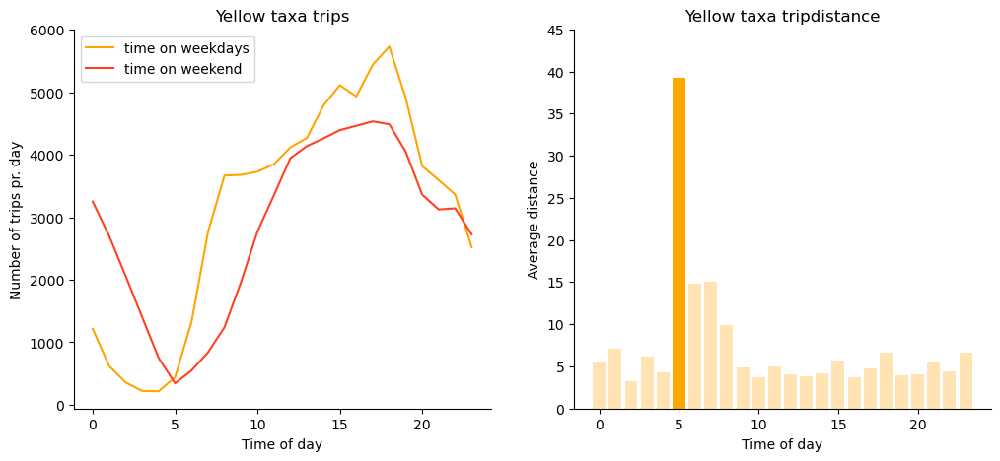

In [32]:
# Find the column with the highest count 
max_count_yellow_dist = plot_Tripdistance['count'].idxmax()
plot_Tripdistance = df_yellow.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')


fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# what to plot:
axes[0].plot(plot_weekday['hour'], plot_weekday['count']/NumberOfDates_weekday, color='orange', label='time on weekdays')
axes[0].set_xlabel('Time of day')
axes[0].set_ylabel('Number of trips pr. day')
axes[0].set_title('Yellow taxa trips')

# Plot of yellow, count pr. weekday:
axes[0].plot(plot_weekend['hour'], plot_weekend['count']/NumberOfDates_weekend, color='#ff4122', label='time on weekend')

#axes[1].set_xlabel('Time of day during weekend')
#axes[1].set_ylabel('Number of trips')
#axes[1].set_title('Yellow taxa trips')
axes[0].legend()
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ------------------------------------------------------------------------- #
# Plot Tripdistance for yellow taxas
axes[1].bar(plot_Tripdistance['hour'], plot_Tripdistance['count'], color='orange', alpha = 0.3, label='time of weekday')
axes[1].bar(plot_Tripdistance['hour'][max_count_yellow_dist], plot_Tripdistance['count'], color='orange', alpha = 1, label='time of weekday')
axes[1].set_xlabel('Time of day')
axes[1].set_ylabel('Average distance')
axes[1].set_title('Yellow taxa tripdistance')
axes[1].set_ylim(0, 45)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
# ------------------------------------------------------------------------- #

# Show the plot
plt.savefig('Task4_TripsAndDistance_Yellow')
plt.show()


**Thoughts behind the plot:**

The first plots shows number of trips pr. day pr. hour.
We used the red line to show weekend since it is the "atypical" days and the consistent orange to show weekdays (the color used throughout the nodebook to show "normal" days).

One of the guidlines to remove clutter is to label data directly, but since the lines are as close as they are, we decided it would be better to add a legend to make it more readable.

We want to show that the trend is similar but a little bit different since the weekends have more activity during night, and the weekdays have more activity during the day.

The second plot shows average distance pr. hour.
We wantet to highlight that at 5 people take significant longer trips. Probably becouse of lack of public transportation or it could be an error in the dataset.

Just to make a quick check, we alse plot the second plot divided in weekday and weekend and see that both groups have significantly longer trips during 5 o clock:

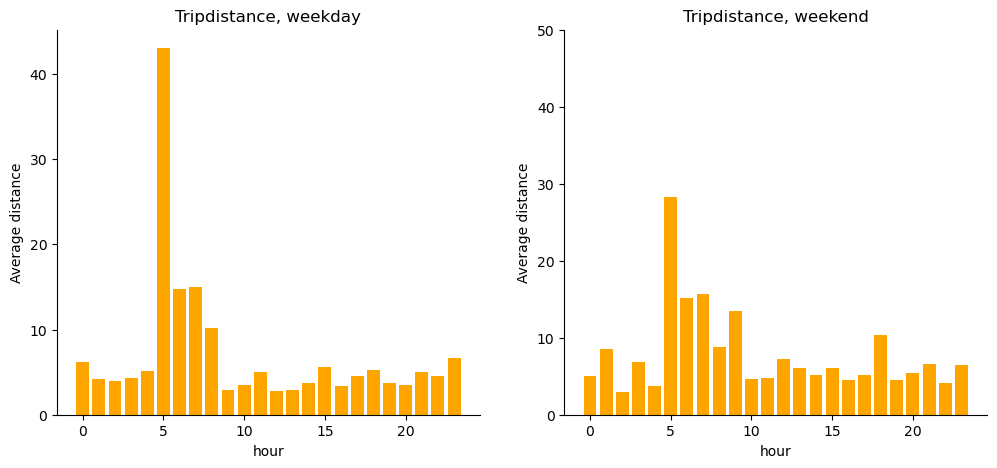

In [33]:
## Trip distance


# Here we choose to use df_yellow and not 

plot_weekend = weekend.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')
plot_weekday = weekday.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')


fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# what to plot:
axes[0].bar(plot_weekday['hour'], plot_weekday['count'], color='orange', label='time on weekends')
axes[0].set_xlabel('hour')
axes[0].set_ylabel('Average distance')
axes[0].set_title('Tripdistance, weekday')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Plot of yellow, count pr. weekday:
axes[1].bar(plot_weekend['hour'], plot_weekend['count'], color='orange', label='time of weekday')
axes[1].set_xlabel('hour')
axes[1].set_ylabel('Average distance')
axes[1].set_title('Tripdistance, weekend')
axes[1].set_ylim(0, 50)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
                  
                  
# Show the plot
plt.show()


If we instead look at the filtered data from task 2, the curve is much more flat. This means that a few very long trips puches the average up:

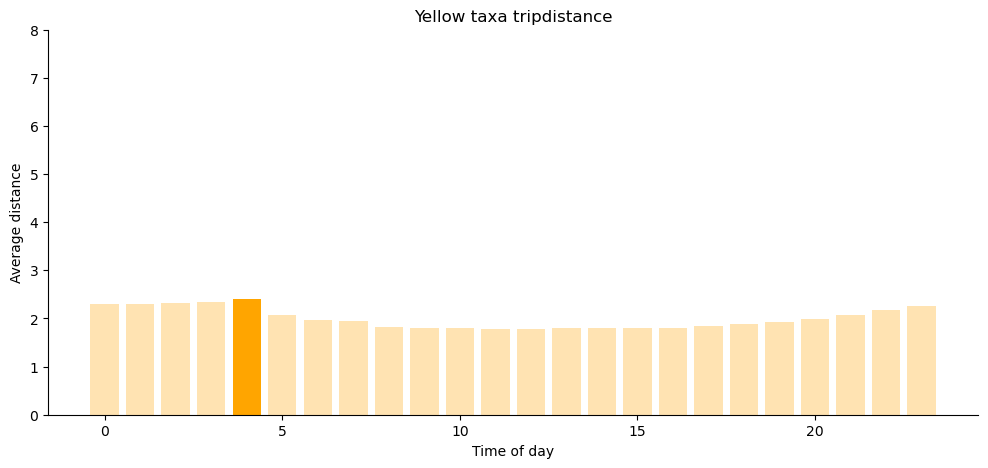

In [34]:
# Find the column with the highest count 

plot_Tripdistance = df_yellow_filtered.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')
max_count_yellow_dist = plot_Tripdistance['count'].idxmax()


fig, axes = plt.subplots(1, 1, figsize=(12, 5))


# ------------------------------------------------------------------------- #
# Plot Tripdistance for yellow taxas
axes.bar(plot_Tripdistance['hour'], plot_Tripdistance['count'], color='orange', alpha = 0.3, label='time of weekday')
axes.bar(plot_Tripdistance['hour'][max_count_yellow_dist], plot_Tripdistance['count'], color='orange', alpha = 1, label='time of weekday')
axes.set_xlabel('Time of day')
axes.set_ylabel('Average distance')
axes.set_title('Yellow taxa tripdistance')
axes.set_ylim(0, 8)
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
# ------------------------------------------------------------------------- #

# Show the plot
plt.show()


**Same plot for green taxis:**

In [35]:
# Plots pr. hour on weekday and weekend:
# burde blive lavet til en funktion så den ikke kopieres ned..
plot_Tripdistance = df_green.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')



# plot weekend and weekday for pickup times
weekend = df_green[df_green['weekday']>4]
weekday = df_green[df_green['weekday']<=4]

#Number of days for calculating trips pr. day:
NumberOfDates_weekend = len(weekend['datetime'].dt.date.unique())
NumberOfDates_weekday = len(weekday['datetime'].dt.date.unique())


plot_weekend = weekend.groupby(['hour'])['VendorID'].count().reset_index(name='count')
plot_weekday = weekday.groupby(['hour'])['VendorID'].count().reset_index(name='count')

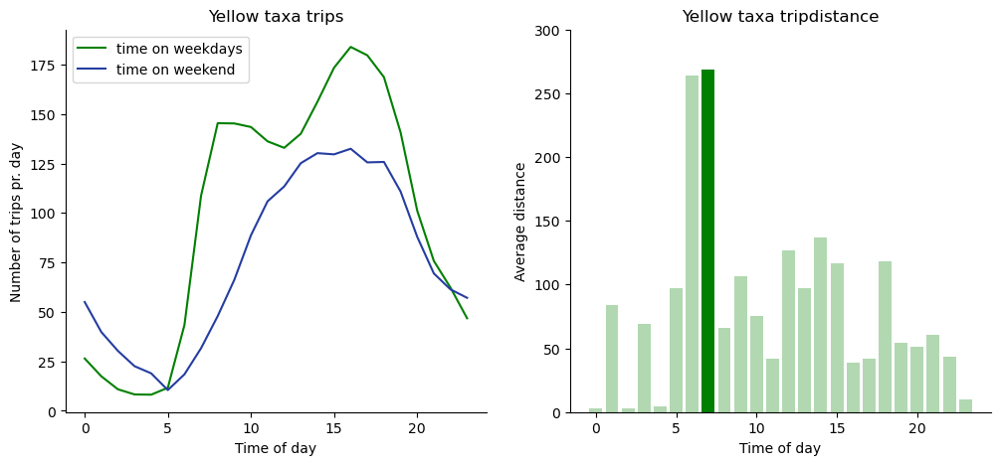

In [36]:
# Find the column with the highest count 
max_count_green_dist = plot_Tripdistance['count'].idxmax()
plot_Tripdistance = df_green.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# what to plot:
axes[0].plot(plot_weekday['hour'], plot_weekday['count']/NumberOfDates_weekday, color='green', label='time on weekdays')
axes[0].set_xlabel('Time of day')
axes[0].set_ylabel('Number of trips pr. day')
axes[0].set_title('Yellow taxa trips')

# Plot of green, count pr. weekday:
axes[0].plot(plot_weekend['hour'], plot_weekend['count']/NumberOfDates_weekend, color='#253DA1', label='time on weekend')

#axes[1].set_xlabel('Time of day during weekend')
#axes[1].set_ylabel('Number of trips')
#axes[1].set_title('Yellow taxa trips')
axes[0].legend()
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ------------------------------------------------------------------------- #

# Plot Tripdistance for yellow taxas
axes[1].bar(plot_Tripdistance['hour'], plot_Tripdistance['count'], color='Green', alpha = 0.3, label='time of weekday')
axes[1].bar(plot_Tripdistance['hour'][max_count_green_dist], plot_Tripdistance['count'], color='Green', alpha = 1, label='time of weekday')
axes[1].set_xlabel('Time of day')
axes[1].set_ylabel('Average distance')
axes[1].set_title('Yellow taxa tripdistance')
axes[1].set_ylim(0, 300)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
# ------------------------------------------------------------------------- #

# Show the plot
plt.savefig('Task4_TripsAndDistance_Green')
plt.show()

This plot is similar to the one for yellow taxis, with the same thoughts behind it. Again we have significantly higher values early morning.

Besides that, all the distances is a lot higher for green than it is for yellow. It could be that since greens taxis have more costumers outside Manhatten (relativly to yellow) the distances they drive are longer.
It could also be a mistake in the data though..

Again we plot the filtered data from task 2. This time with both the yellow and green taxis and we see that when we cut the most extreme values away, the average tripdistance are very similar between the to taxi types.

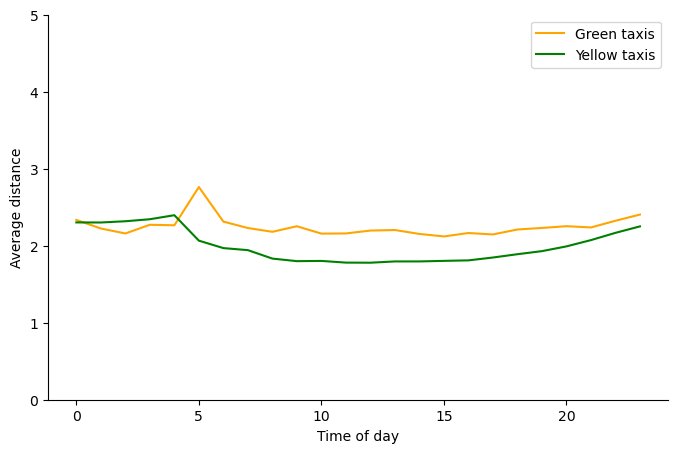

In [37]:
# Find the column with the highest count 

plot_Tripdistance_green = df_green_filtered.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')
max_count_green_dist = plot_Tripdistance_green['count'].idxmax()

plot_Tripdistance_yellow = df_yellow_filtered.groupby(['hour'])['trip_distance'].mean().reset_index(name='count')
max_count_yellow_dist = plot_Tripdistance_yellow['count'].idxmax()


fig, axes = plt.subplots(1, 1, figsize=(8, 5))


# ------------------------------------------------------------------------- #
# Plot Tripdistance for yellow taxas
axes.plot(plot_Tripdistance_green['hour'], plot_Tripdistance_green['count'], color='orange', alpha = 1, label='Green taxis')
axes.plot(plot_Tripdistance_yellow['hour'], plot_Tripdistance_yellow['count'], color='green', alpha = 1, label='Yellow taxis')
# axes.bar(plot_Tripdistance['hour'][max_count_green_dist], plot_Tripdistance['count'], color='orange', alpha = 1, label='time of weekday')
axes.set_xlabel('Time of day')
axes.set_ylabel('Average distance')
#axes.set_title('Yellow taxa tripdistance')
axes.set_ylim(0, 5)
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.legend()
# ------------------------------------------------------------------------- #

# Show the plot
plt.show()

**Fare Amount**

We plot the fare amount for yellow and green taxis in the same plot and see they are very similar. We se a high spike around 5, wich relates to the high distances at the same time:

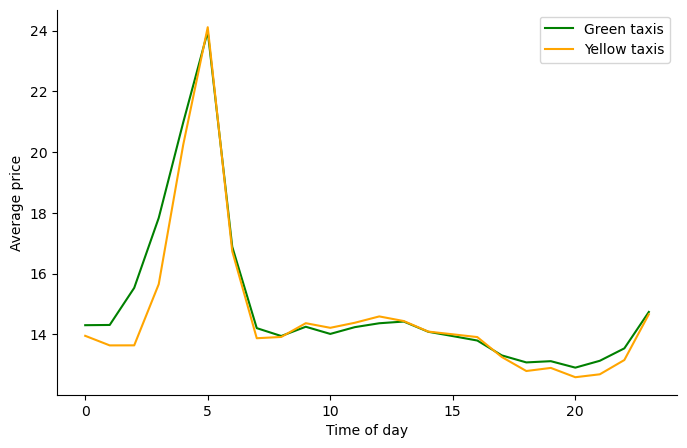

In [38]:
## Fare amount
plot_green_amount = df_green.groupby(['hour'])['fare_amount'].mean().reset_index(name='count')
plot_yellow_amount = weekday.groupby(['hour'])['fare_amount'].mean().reset_index(name='count')

fig, axes = plt.subplots(1, 1, figsize=(8, 5))

# what to plot:
axes.plot(plot_green_amount['hour'], plot_green_amount['count'], color='green', label='Green taxis')
axes.set_xlabel('Time of day')
axes.set_ylabel('Average price')
#axes.set_title('Price of taxa trips')
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)

# Plot of yellow, count pr. weekday:
axes.plot(plot_yellow_amount['hour'], plot_yellow_amount['count'], color='orange', label='Yellow taxis')
#axes[1].set_xlabel('Average price in dollars')
#axes[1].set_ylabel('Average price')
#axes[1].set_title('Green  ')
axes.legend()

# Show the plot
plt.savefig('Task4_PriceOfTrips')
plt.show()

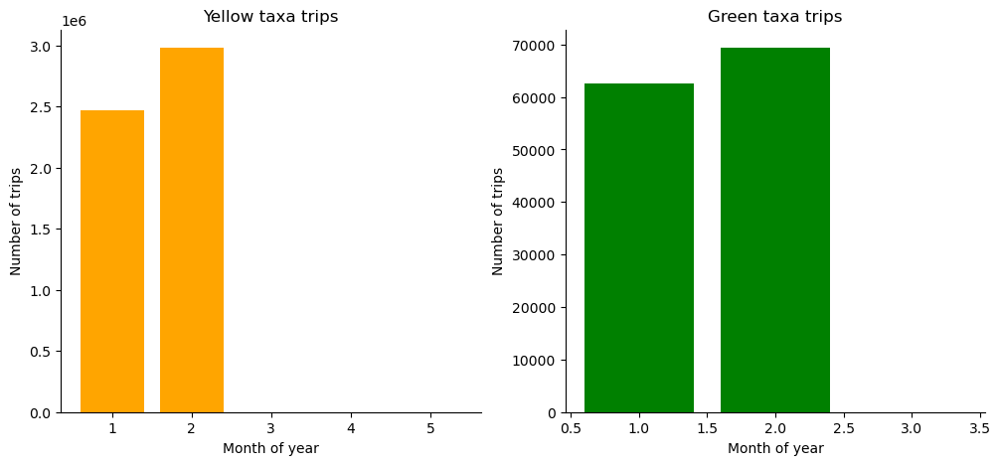

In [39]:
# Month of year:

# grouping:
yellow_month = df_yellow.groupby(['month'])['VendorID'].count().reset_index(name='count')
green_month = df_green.groupby(['month'])['VendorID'].count().reset_index(name='count')


# Plot:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot of yellow, count pr. weekday:
axes[0].bar(yellow_month['month'], yellow_month['count'], color='orange', label='Day of week')
axes[0].set_xlabel('Month of year')
axes[0].set_ylabel('Number of trips')
axes[0].set_title('Yellow taxa trips')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
#axes[0].xticks(yellow_month['month'].astype(int))

# what to plot:
axes[1].bar(green_month['month'], green_month['count'], color='green', label='Day of week')
axes[1].set_xlabel('Month of year')
axes[1].set_ylabel('Number of trips')
axes[1].set_title('Green taxa trips')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# Show the plot
plt.show()

**Textbook Practice**: Use the principle "clutter is your enemy" to simplify your plots/graphs properly. Explain your motivation for each plot.

(For the specific motivation behind each plot: see what we wrote below the plots.)

**Clutter is your enemy: applied to all plots**

We have used the checklist from the book to make the plots less cluttered to look at. This includes the following:

Deleting chart borders were et made sence. Often the top and right border.

Make sure to not show gridlines.

Thinking about datalabels and wether they should be on data directly and if we should modify the labels on the x- and y-axis to make it more readable.

throughout this nodebook, we have been consistent with our color use and used yellow/orange/red for yellow taxis and Green for green taxis to make it intuitive to now which data we are looking at.


### Task 5: Time-Series Forecasting
Use Prophet or a similar tool to forecast the number of taxi rides in the future, respectively for green and yellow taxis. This includes creating a time-series model, tuning its parameters, and validating its performance. Also, interpret the model's predictions and identify the factors driving the forecasted trends.

A good example for using Prophet to do time-series forecasting can be found here https://www.kaggle.com/code/prashant111/tutorial-time-series-forecasting-with-prophet

**Modeling Details**:
Conduct parameter tuning for the forecasting model. Use cross-validation techniques appropriate for time series data, like time-based splitting.

**Evaluation Metrics**:
Specify which metrics will be used to evaluate the forecasting model, such as MAE (Mean Absolute Error), RMSE (Root Mean Square Error), or MAPE (Mean Absolute Percentage Error). Explain why these metrics are suitable (or not suitable) for the task.

**Visualization and Textbook Practice**: Plotting the forecasts against actual values to visually assess the model's performance. Creating a plot that shows how the forecast and confidence intervals change over time. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention shere you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Hint**: In order to evaluate how your model performs, you need to split the dataset to be train and test. For time-series data, we cannot randomly select the data record (i.e. the rows) to be in train or test. Namely, all training data must be before the earliest test data. In other words, the model is always trained on historical data and then used to forecast the future.

### Solution

**Models:**
We used data for the period 1-6 month in 2022.

We made three predictions models:

model1:
trained on month 1-3 an predicted on month 4

model2:
trained on month 1-4 an predicted on month 5

model3:
trained on month 1-5 an predicted on month 6

For evaluation RMSE was used between the predicted model and the actual data.
Model 1 and 2 performed similar (model 2 slightly better) and model 3 performed significally better.

This is probably because of the trend in the data were the first months in the year have less trips and the later months have a similar amount of trips.

It could have been interesting to make a model on month 3-5 and compare the performance to se how much of the difference is do to more data and haw much is do to the low amounts of trips in the first couple of months.


In [14]:
# Timeseries crossvalidation:
# test should always come after training.
# eg: train = month 1 and 2  - test = month 3
#     train = month 1, 2 and 3  - test = month 4


import matplotlib.pyplot as plt

In [15]:

# Renaming columns for model:
df_yellow = df_yellow.rename(columns={'date': 'ds',
                        'count': 'y'})

df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,datetime,weekday,hour,month,ds
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,...,0.0,0.3,21.95,2.5,0.0,2022-01-01 00:35:40,5,0,1,2022-01-01
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,...,0.0,0.3,13.30,0.0,0.0,2022-01-01 00:33:43,5,0,1,2022-01-01
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,...,0.0,0.3,10.56,0.0,0.0,2022-01-01 00:53:21,5,0,1,2022-01-01
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,...,0.0,0.3,11.80,2.5,0.0,2022-01-01 00:25:21,5,0,1,2022-01-01
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,...,0.0,0.3,30.30,2.5,0.0,2022-01-01 00:36:48,5,0,1,2022-01-01


In [16]:
# Training Data:

#df_green_train1=df_green[(df_green['datetime'].dt.month <4)]
df_yellow_train1=df_yellow[(df_yellow['datetime'].dt.month <4)]

#df_green_train2=df_green[(df_green['datetime'].dt.month <5)]
df_yellow_train2=df_yellow[(df_yellow['datetime'].dt.month <5)]

#df_green_train3=df_green[(df_green['datetime'].dt.month <6)]
df_yellow_train3=df_yellow[(df_yellow['datetime'].dt.month <6)]

# Test Data
#df_green_test=df_green[(df_green['datetime'].dt.month == 6)]
df_yellow_test1=df_yellow[(df_yellow['datetime'].dt.month == 4)]
df_yellow_test2=df_yellow[(df_yellow['datetime'].dt.month == 5)]
df_yellow_test3=df_yellow[(df_yellow['datetime'].dt.month == 6)]

In [17]:
df_yellow_test1.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,datetime,weekday,hour,month,ds
733466,2,2022-04-06 04:09:25,2022-04-06 04:18:39,2.0,1.67,1.0,N,161,234,1,...,0.0,0.3,12.80,2.5,0.0,2022-04-06 04:09:25,2,4,4,2022-04-06
652412,2,2022-04-12 01:50:51,2022-04-12 02:01:13,4.0,2.26,1.0,N,234,246,1,...,0.0,0.3,16.56,2.5,0.0,2022-04-12 01:50:51,1,1,4,2022-04-12
657060,2,2022-04-12 02:07:37,2022-04-12 02:14:30,3.0,1.69,1.0,N,246,163,1,...,0.0,0.3,13.56,2.5,0.0,2022-04-12 02:07:37,1,2,4,2022-04-12
657061,2,2022-04-12 02:31:23,2022-04-12 09:43:34,4.0,2.48,1.0,N,113,68,1,...,0.0,0.3,13.80,2.5,0.0,2022-04-12 02:31:23,1,2,4,2022-04-12
1865502,2,2022-04-02 10:38:21,2022-04-02 10:51:16,3.0,2.08,1.0,N,161,43,2,...,0.0,0.3,13.80,2.5,0.0,2022-04-02 10:38:21,5,10,4,2022-04-02


In [18]:
# mean pr. day for test:
#df_green_test_mean = df_green_test.groupby('date')['VendorID'].count().reset_index(name='count')
df_yellow_test_mean1 = df_yellow_test1.groupby('ds')['VendorID'].count().reset_index(name='count')
df_yellow_test_mean2 = df_yellow_test2.groupby('ds')['VendorID'].count().reset_index(name='count')
df_yellow_test_mean3 = df_yellow_test3.groupby('ds')['VendorID'].count().reset_index(name='count')

In [19]:

# Install prophet with pip:
# pip install prophet

# import 

from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

**Forecast model for Yellow taxis:**

In [22]:
# Define df to use
yellow_ToForcast1 = df_yellow_train1.groupby([ 'ds'])['VendorID'].count().reset_index(name='y')
yellow_ToForcast2 = df_yellow_train2.groupby([ 'ds'])['VendorID'].count().reset_index(name='y')
yellow_ToForcast3 = df_yellow_train3.groupby([ 'ds'])['VendorID'].count().reset_index(name='y')

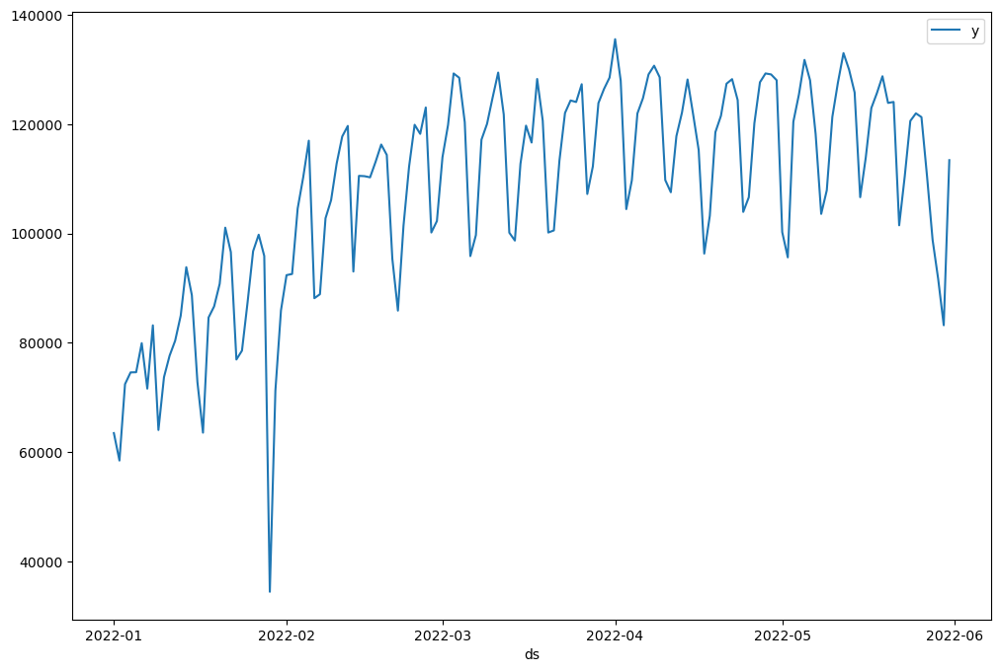

In [23]:
# Show data:
ax = yellow_ToForcast3.set_index('ds').plot(figsize=(12, 8))
plt.show()

In [24]:
# Model

# set the uncertainty interval to 95% (the Prophet default is 80%)
model1 = Prophet(interval_width=0.95)

# fit data for yellow to forcast
model1.fit(yellow_ToForcast1)


model2 = Prophet(interval_width=0.95)
model2.fit(yellow_ToForcast2)

model3 = Prophet(interval_width=0.95)
model3.fit(yellow_ToForcast3)

15:16:36 - cmdstanpy - INFO - Chain [1] start processing
15:16:36 - cmdstanpy - INFO - Chain [1] done processing
15:16:36 - cmdstanpy - INFO - Chain [1] start processing
15:16:36 - cmdstanpy - INFO - Chain [1] done processing
15:16:37 - cmdstanpy - INFO - Chain [1] start processing
15:16:37 - cmdstanpy - INFO - Chain [1] done processing


In [25]:
# make prediction periods:
future_dates1 = model1.make_future_dataframe(periods=31, freq='D')
future_dates2 = model2.make_future_dataframe(periods=31, freq='D')
future_dates3 = model3.make_future_dataframe(periods=31, freq='D')


In [26]:
forecast1 = model1.predict(future_dates1)
forecast2 = model2.predict(future_dates2)
forecast3 = model3.predict(future_dates3)
#forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()
#forecast.head()

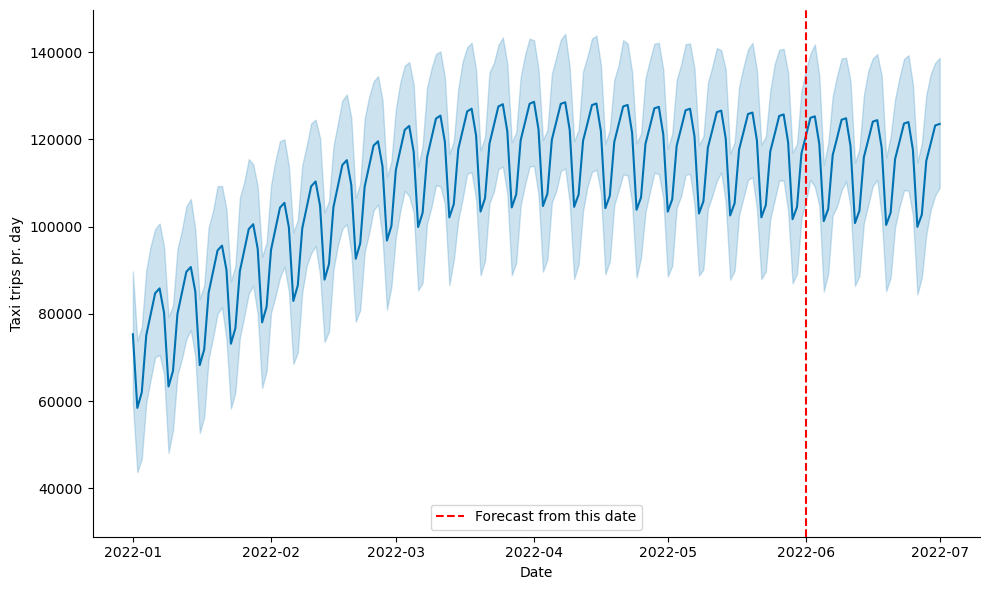

In [27]:
# Make Figure

from prophet.plot import plot

fig = model3.plot(forecast3, uncertainty=True)
# Set the labels for the x and y axes
fig.gca().set_xlabel("Date")
fig.gca().set_ylabel("Taxi trips pr. day")
# Show the plot



ax = fig.gca()
ax.get_lines()[0].set_visible(False)  # Hide the data points

vertical_line_position = pd.to_datetime('2022-06-01')  # Replace with your desired date
ax.axvline(x=vertical_line_position, color='red', linestyle='--', label='Vertical Line')

# Remove the grid
ax.grid(False)

# Set legend handles and labels to show only the vertical line
legend_handles = [plt.Line2D([0], [0], color='red', linestyle='--')]
legend_labels = ['Forecast from this date']

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Create the legend
ax.legend(handles=legend_handles, labels=legend_labels, loc='lower center')

plt.savefig('Taxi_Task5_Forecast_Yellow')
plt.show()

In [28]:
# # Other plots:
# model.plot_components(forecast)

**Nodes to plot:**

We choose to show the data on a line chard since we look at a continium over time. the line was importent to show how the model is working with a weekly trend. If it was only displayed with dots, it would be a lot harder for the viewer to read.

We elimineted clutter by removing gridlines, borders and not showing datapoints since we want the model to be in focus.

The red line was made to focus attention to this area and make it clear were the model went from area with training data to forecast.
We have been very consistent with the colors yellow and green through the nodebook, but here we decidet to go with light blue since we want the red line to be the focus point and wanted the model to be a more neutral color.

For the errors calculatet below, we have showed them in a table in LaTex beamer, since we thought that was the most effective visual to show 3 individual numbers.

In [29]:
# calculate squared error for all
from sklearn.metrics import mean_squared_error
from math import sqrt

y_actual1 = df_yellow_test_mean1['count']
y_actual2 = df_yellow_test_mean2['count']
y_actual3 = df_yellow_test_mean3['count']
#y_predicted = forecast[forecast[ds]]

forecast_ToTest1 = forecast1[(forecast1['ds'].dt.month == 4)]
y_predicted1 = forecast_ToTest1['yhat']

forecast_ToTest2 = forecast2[(forecast2['ds'].dt.month == 5)]
y_predicted2 = forecast_ToTest2['yhat']

forecast_ToTest3 = forecast3[(forecast3['ds'].dt.month == 6)]
y_predicted3 = forecast_ToTest3['yhat']


In [30]:
#rms
sqrt(mean_squared_error(y_actual1, y_predicted1))


12175.130471104014

In [31]:
#rms
sqrt(mean_squared_error(y_actual2, y_predicted2))

11083.949308244244

In [32]:
#rms
sqrt(mean_squared_error(y_actual3, y_predicted3))

6040.0585430747715

**Green taxis:**

Since we had memory problems, we decided to only make forecast on yellow taxis, since we wantet to be able to run the nodebook as a whole and still be able to work with a big amount of data.

It is expected that the forecast model would be very similar to the one for the yellow taxis (just with lower numbers of trips) since we saw in task 4, that the trends for months and weeks are very similar for the two taxi types.

### Task 6: Report and Presentation
- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This includes summarizing your methodology, presenting your results, and discussing your conclusions. Also, identify the limitations of your analysis and suggest areas for future research. The **Textbook Practice** parts (that consists of your reflections to the textbook content) are crucial.